The task for this notebook is:

improving this model. You can use Transfer Learning from COCO models, or the recent R-CNN.
Building a model that detects specific objects (more classes).
Building a model for 3D Bounding Box detection (here stereoscopic data would be needed), but Kitti also has it.

# Downloading data

Fortunately, Kaggle already has 22GB of KITTI data in its datasets, so we don't have to download it anymore. Additionally, we also use a calibration file for the cameras mounted in the car.

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import cv2
import matplotlib.pyplot as plt
import os

from collections import defaultdict


# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    print('Ilość danych:', len(filenames), ': ', dirname)
   
# You can write up to 5GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session
from os import listdir
from os.path import isfile, join
import pandas as pd
from sklearn.model_selection import train_test_split
import gc; gc.enable() # memory is tight
import random

plt.rcParams['figure.figsize'] = (25, 14)


import tensorflow as tf
import tensorflow.keras as keras
print(tf.__version__)
!nvidia-smi

Ilość danych: 0 :  /kaggle/input
Ilość danych: 0 :  /kaggle/input/kitti-dataset
Ilość danych: 0 :  /kaggle/input/kitti-dataset/data_object_calib
Ilość danych: 0 :  /kaggle/input/kitti-dataset/data_object_calib/training
Ilość danych: 7481 :  /kaggle/input/kitti-dataset/data_object_calib/training/calib
Ilość danych: 0 :  /kaggle/input/kitti-dataset/data_object_calib/testing
Ilość danych: 7518 :  /kaggle/input/kitti-dataset/data_object_calib/testing/calib
Ilość danych: 0 :  /kaggle/input/kitti-dataset/data_object_image_2
Ilość danych: 0 :  /kaggle/input/kitti-dataset/data_object_image_2/training
Ilość danych: 7481 :  /kaggle/input/kitti-dataset/data_object_image_2/training/image_2
Ilość danych: 0 :  /kaggle/input/kitti-dataset/data_object_image_2/testing
Ilość danych: 7518 :  /kaggle/input/kitti-dataset/data_object_image_2/testing/image_2
Ilość danych: 0 :  /kaggle/input/kitti-dataset/data_object_label_2
Ilość danych: 0 :  /kaggle/input/kitti-dataset/data_object_label_2/training
Ilość dan

## CONFIGURATION

https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/

In [2]:
# allows preserving identical results, as well as the behavior of the code,
# thanks to which randomness does not creep into our calculations and each time we get the same results
SEED = 5000

def set_seed(SEED):
    np.random.seed(SEED)
    random.seed(SEED)
    tf.random.set_seed(SEED)
    
    return SEED
    
set_seed(SEED)

BASE_DIR = '/kaggle/input/kitti-dataset/'
LABEL_PATH = os.path.join(BASE_DIR,'data_object_label_2/training/label_2')
IMAGE_PATH = os.path.join(BASE_DIR,'data_object_image_2/training/image_2')
IMAGE_STEREO_PATH = os.path.join(BASE_DIR,'data_object_image_3/training')
CALIB_PATH = os.path.join(BASE_DIR,'data_object_calib/training/calib')


"""
IMAGE_WIDTH = 256
IMAGE_HEIGHT = 160

# IMAGE SIZE (INPUT): VERY IMPORTANT HERE WHEN USING CONVOLUTIONAL NETWORKS LIKE UNET.

# Because each time the image is downscaled by 2 in a layer, the size is rounded to an integer.
# If at some point the size were an odd number. For example: we have such a network

conv2d_66 (Conv2D)           (None, 100, 175, 32)      9248      
_________________________________________________________________
max_pooling2d_26 (MaxPooling (None, 50, 87, 32)        0   

# then in the case of UNET, when we combine the initial layers with the subsequent ones that came out, after
# the output they are multiplied by two, so the layer we want to connect with will have size 86 and creating such
# a model will return an error.
# Remember that the sizes must be multiples of 8. (in the case of downscaling 3 times,
# or 16 in the case of 4 downscaling operations)

https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/
"""

IMAGE_WIDTH = 256
IMAGE_HEIGHT = 160

# Viewing the data

we fetch data from all directories, and we fetch a list of masks and images.

In [3]:
images =  [(f) for f in listdir(IMAGE_PATH) if isfile(join(IMAGE_PATH, f))]
masks = [(f) for f in listdir(LABEL_PATH) if isfile(join(LABEL_PATH, f))]
masks.sort()

df = pd.DataFrame(np.column_stack([masks]), columns=['masks'])
df['images'] = df['masks'].apply(lambda x: x[:-3]+'png')


# We check whether all masks have associated images
no_images = df[df['images'].apply(lambda i:  i not in images)]
if(len(no_images)>0):
    print("Niektore maski nie posiadają swoich obrazów")
    print(no_images)
else:
    print("BARDZO DOBRZE: Wszystke maski posiadaja swoje obrazy")


    
img = cv2.imread(os.path.join(IMAGE_PATH, '000015.png') )    
print('Image shape: ', img.shape)
print(df.shape)
df.head()

BARDZO DOBRZE: Wszystke maski posiadaja swoje obrazy
Image shape:  (374, 1238, 3)
(7481, 2)


,masks,images
0,000000.txt,000000.png
1,000001.txt,000001.png
2,000002.txt,000002.png
3,000003.txt,000003.png
4,000004.txt,000004.png


## Helper functions for the data

Get labels: returns the necessary data for each image, each object is a separate line with a description. The most important parameters are:

* **type**: the type of object
* **bounding box**: a square around the object. `bbox_xmin`, `bbox_ymin`, `bbox_xmax`, `bbox_ymax`,
* **3d bounding box**: To determine it, 3 parameters are needed:

1.  **`dim_height`, `dim_width`, `dim_length`** - respectively the height, width and length of the bounding box
2. **`loc_x`, `loc_y`, `loc_z`** - where the given object is located
3. **`rotation_y`** - how the object is rotated

In [4]:
def get_labels(label_filename):
    """
        get_labels returns. bounding boxes for each car. Thanks to it we can see the contours of the cars,
        it returns a list with the bounding box values.
        
        :param label_filename: filename like kitti_3d/{training,testing}/label_2/id.txt
        Returns Pandas DataFrame
        
        The label files contain the following information, which can be read and
        written using the matlab tools (readLabels.m, writeLabels.m) provided within
        this devkit. All values (numerical or strings) are separated via spaces,
        each row corresponds to one object. The 15 columns represent:
        #Values    Name      Description
        ----------------------------------------------------------------------------
           1    type         Describes the type of object: 'Car', 'Van', 'Truck',
                             'Pedestrian', 'Person_sitting', 'Cyclist', 'Tram',
                             'Misc' or 'DontCare'
           1    truncated    Float from 0 (non-truncated) to 1 (truncated), where
                             truncated refers to the object leaving image boundaries
           1    occluded     Integer (0,1,2,3) indicating occlusion state:
                             0 = fully visible, 1 = partly occluded
                             2 = largely occluded, 3 = unknown
           1    alpha        Observation angle of object, ranging [-pi..pi]
           4    bbox         2D bounding box of object in the image (0-based index):
                             contains left, top, right, bottom pixel coordinates
           3    dimensions   3D object dimensions: height, width, length (in meters)
           3    location     3D object location x,y,z in camera coordinates (in meters)
           1    rotation_y   Rotation ry around Y-axis in camera coordinates [-pi..pi]
           1    score        Only for results: Float, indicating confidence in
                             detection, needed for p/r curves, higher is better.
    """
    data =  pd.read_csv(os.path.join(LABEL_PATH,label_filename), sep=" ", 
                       names=['label', 'truncated', 'occluded', 'alpha', 
                              'bbox_xmin', 'bbox_ymin', 'bbox_xmax', 
                              'bbox_ymax', 'dim_height', 'dim_width', 'dim_length', 
                              'loc_x', 'loc_y', 'loc_z', 'rotation_y', 'score'])
    
    return data
    
get_labels('000015.txt')

,label,truncated,occluded,alpha,bbox_xmin,bbox_ymin,bbox_xmax,bbox_ymax,dim_height,dim_width,dim_length,loc_x,loc_y,loc_z,rotation_y,score
0,Car,0.89,0,2.29,0.00,194.70,414.71,373.00,1.57,1.67,4.14,-2.75,1.70,4.10,1.72,NaN
1,Pedestrian,0.00,1,0.71,1021.76,133.28,1101.39,316.63,1.81,1.06,0.73,4.75,1.33,7.59,1.25,NaN
2,Pedestrian,0.00,0,-1.58,672.23,171.73,690.13,224.33,1.73,0.84,0.86,2.46,1.41,24.14,-1.48,NaN
3,Pedestrian,0.00,0,-1.59,692.68,169.14,712.48,224.03,1.81,0.90,0.95,3.30,1.40,24.22,-1.46,NaN
4,Pedestrian,0.00,0,-1.46,537.84,168.08,560.90,224.34,1.78,0.92,1.01,-1.79,1.36,23.30,-1.54,NaN
5,DontCare,-1.00,-1,-10.00,916.14,175.59,973.32,253.55,-1.00,-1.00,-1.00,-1000.00,-1000.00,-1000.00,-10.00,NaN
6,DontCare,-1.00,-1,-10.00,628.80,173.19,653.95,196.66,-1.00,-1.00,-1.00,-1000.00,-1000.00,-1000.00,-10.00,NaN
7,DontCare,-1.00,-1,-10.00,610.47,175.76,625.72,205.87,-1.00,-1.00,-1.00,-1000.00,-1000.00,-1000.00,-10.00,NaN
8,DontCare,-1.00,-1,-10.00,766.54,168.32,841.38,261.86,-1.00,-1.00,-1.00,-1000.00,-1000.00,-1000.00,-10.00,NaN
9,DontCare,-1.00,-1,-10.00,464.22,177.67,508.93,230.69,-1.00,-1.00,-1.00,-1000.00,-1000.00,-1000.00,-10.00,NaN


## Bounding Box 2d

It allows us to draw a Bounding Box from a mask file. 4 parameters are needed for each:

* `bbox_xmin	bbox_ymin	bbox_xmax	bbox_ymax` - the position of the rectangle.
* `label` - the type of object

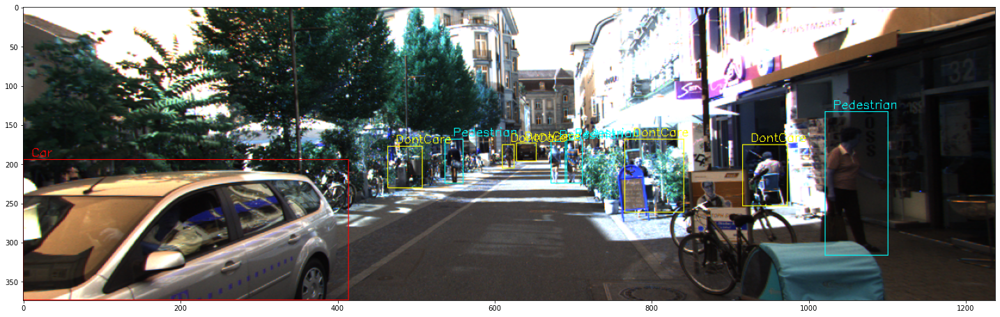

In [5]:
def open_image(image_filename):
    return cv2.imread(os.path.join(IMAGE_PATH, image_filename))
    
    
def draw_box2d_id(id):
    """
        pozwala zobazyc jakie BoundingBox sa dla naszego zestawu danych
    """
    return draw_box2d(open_image(id + '.png'),
                      get_labels(id + '.txt'))

LABEL_COLORS = {
    'Car': (255,0,0), 
    'Van': (255,255,0), 
    'Truck': (255,255,255),
    'Pedestrian': (0,255,255),
    'Person_sitting': (0,255,255), 
    
    'Cyclist': (0,128,255), 
    'Tram': (128,0,0),
    'Misc': (0,255,255),
    'DontCare': (255,255,0)
}

def draw_box2d(image, labels, ax = None):
    """
        pozwala rysowac boxy 2d dla naszego modelu.
        
        
        :param label_filename: filname like kitti_3d/{training,testing}/label_2/id.txt
        Returns Pandas DataFrame
    """
    img = image.copy()
    for index, row in labels.iterrows():
        left_corner = (int(row.bbox_xmin), int(row.bbox_ymin))
        right_corner = (int(row.bbox_xmax), int(row.bbox_ymax))
        label_color = LABEL_COLORS.get(row.label,(0,255,0))
        
        img = cv2.rectangle(img, 
                            left_corner, right_corner, label_color, 1)
        img = cv2.putText(img, str(row.label), 
                          (left_corner[0] + 10, left_corner[1] - 4) , 
                          cv2.FONT_HERSHEY_SIMPLEX, 0.5, 
                          label_color, 1)
    if ax == None:
        plt.imshow(img)
    else:
        ax.imshow(img)

draw_box2d_id('000015')

### Draw 3D

A calibration file is also needed; it also contains information about the camera settings required when drawing the image.

Additionally, presenting a 3D bounding box requires transforming it and overlaying it onto a flat image. For this we need a few helper functions below. Flat objects of type DontCare we draw as a 2D BoundingBox. These objects do not have 3D information.



#### Calibration file
The calibration file contains information about how the image was captured from the car's camera. The camera in the car was located on the roof and there are two cameras that are very close to each other (a stereo image, just like with humans, thanks to two eyes we orient ourselves better in 3D space). Besides that, Kitti3D has LIDAR.



https://github.com/yanii/kitti-pcl/blob/master/KITTI_README.TXT


The sensor calibration zip archive contains files, storing matrices in row-aligned order, meaning that the first values correspond to the first row:

calib_cam_to_cam.txt: Camera-to-camera calibration

* S_xx: 1x2 size of image xx before rectification
* K_xx: 3x3 calibration matrix of camera xx before rectification
* D_xx: 1x5 distortion vector of camera xx before rectification
* R_xx: 3x3 rotation matrix of camera xx (extrinsic)
* T_xx: 3x1 translation vector of camera xx (extrinsic)
* S_rect_xx: 1x2 size of image xx after rectification
* R_rect_xx: 3x3 rectifying rotation to make image planes co-planar
* P_rect_xx: 3x4 projection matrix after rectification
* Note: When using this dataset you will most likely need to access only P_rect_xx, as this matrix is valid for the rectified image sequences. maintained

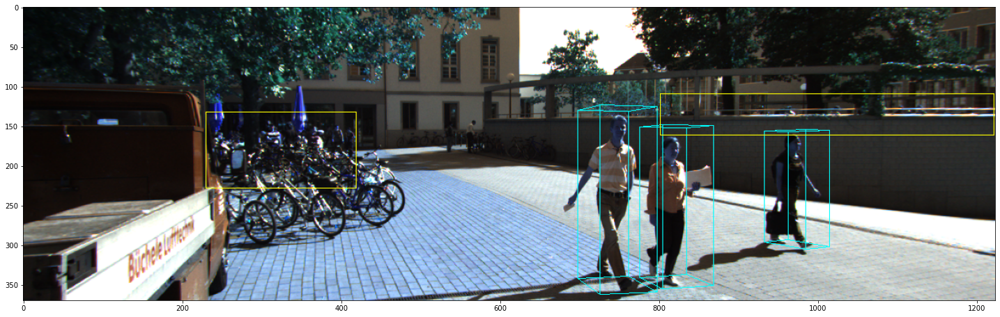

In [6]:
## https://github.com/charlesq34/frustum-pointnets/tree/master/kitti

def get_calibration(id):
    filepath = os.path.join(CALIB_PATH, id + '.txt')
    
    """ Read in a calibration file and parse into a dictionary.
    Ref: https://github.com/utiasSTARS/pykitti/blob/master/pykitti/utils.py
    """
    data = {}
    with open(filepath, "r") as f:
        for line in f.readlines():
            line = line.rstrip()
            if len(line) == 0:
                continue
            key, value = line.split(":", 1)
            # The only non-float values in these files are dates, which
            # we don't care about anyway
            try:
                data[key] = np.array([float(x) for x in value.split()])
            except ValueError:
                pass
    data['P'] = np.reshape(data['P2'], [3, 4])

    return data
    
    
def rotx(t):
    """ 3D Rotation about the x-axis. """
    c = np.cos(t)
    s = np.sin(t)
    return np.array([[1, 0, 0], [0, c, -s], [0, s, c]])


def roty(t):
    """ Rotation about the y-axis. """
    c = np.cos(t)
    s = np.sin(t)
    return np.array([[c, 0, s], [0, 1, 0], [-s, 0, c]])


def rotz(t):
    """ Rotation about the z-axis. """
    c = np.cos(t)
    s = np.sin(t)
    return np.array([[c, -s, 0], [s, c, 0], [0, 0, 1]])


def project_to_image(pts_3d, P):
    """ Project 3d points to image plane.
    Usage: pts_2d = projectToImage(pts_3d, P)
      input: pts_3d: nx3 matrix
             P:      3x4 projection matrix
      output: pts_2d: nx2 matrix
      P(3x4) dot pts_3d_extended(4xn) = projected_pts_2d(3xn)
      => normalize projected_pts_2d(2xn)
      <=> pts_3d_extended(nx4) dot P'(4x3) = projected_pts_2d(nx3)
          => normalize projected_pts_2d(nx2)
    """
    n = pts_3d.shape[0]
    pts_3d_extend = np.hstack((pts_3d, np.ones((n, 1))))
    # print(('pts_3d_extend shape: ', pts_3d_extend.shape))
    pts_2d = np.dot(pts_3d_extend, np.transpose(P))  # nx3
    pts_2d[:, 0] /= pts_2d[:, 2]
    pts_2d[:, 1] /= pts_2d[:, 2]
    return pts_2d[:, 0:2]


# label	truncated	occluded	alpha	bbox_xmin	bbox_ymin	bbox_xmax	bbox_ymax	dim_height	dim_width	
#dim_length	loc_x	loc_y	loc_z	rotation_y	score
def compute_box_3d(obj, P):
    """ Takes an object and a projection matrix (P) and projects the 3d
        bounding box into the image plane.
        Returns:
            corners_2d: (8,2) array in left image coord.
            corners_3d: (8,3) array in in rect camera coord.
    """
    # compute rotational matrix around yaw axis
    R = roty(obj.rotation_y)

    # 3d bounding box dimensions
    l = obj.dim_length
    w = obj.dim_width
    h = obj.dim_height

    # 3d bounding box corners
    x_corners = [l / 2, l / 2, -l / 2, -l / 2, l / 2, l / 2, -l / 2, -l / 2]
    y_corners = [0, 0, 0, 0, -h, -h, -h, -h]
    z_corners = [w / 2, -w / 2, -w / 2, w / 2, w / 2, -w / 2, -w / 2, w / 2]

    # rotate and translate 3d bounding box
    corners_3d = np.dot(R, np.vstack([x_corners, y_corners, z_corners]))
    # print corners_3d.shape
    corners_3d[0, :] = corners_3d[0, :] + obj.loc_x
    corners_3d[1, :] = corners_3d[1, :] + obj.loc_y
    corners_3d[2, :] = corners_3d[2, :] + obj.loc_z
    # print 'cornsers_3d: ', corners_3d
    # only draw 3d bounding box for objs in front of the camera
    if np.any(corners_3d[2, :] < 0.1):
        corners_2d = None
        return corners_2d, np.transpose(corners_3d)

    # project the 3d bounding box into the image plane
    corners_2d = project_to_image(np.transpose(corners_3d), P)
    # print 'corners_2d: ', corners_2d
    return corners_2d, np.transpose(corners_3d)


def draw_projected_box3d(image, qs, color=(0, 255, 0), thickness=2):
    """ Draw 3d bounding box in image
        qs: (8,3) array of vertices for the 3d box in following order:
            1 -------- 0
           /|         /|
          2 -------- 3 .
          | |        | |
          . 5 -------- 4
          |/         |/
          6 -------- 7
    """
    qs = qs.astype(np.int32)
    
    for k in range(0, 4):
        # Ref: http://docs.enthought.com/mayavi/mayavi/auto/mlab_helper_functions.html
        i, j = k, (k + 1) % 4
        # use LINE_AA for opencv3
        # cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness, cv2.CV_AA)
        cv2.line(image, (qs[i, 0], qs[i, 1]), (qs[j, 0], qs[j, 1]), color, thickness)
        i, j = k + 4, (k + 1) % 4 + 4
        cv2.line(image, (qs[i, 0], qs[i, 1]), (qs[j, 0], qs[j, 1]), color, thickness)

        i, j = k, k + 4
        cv2.line(image, (qs[i, 0], qs[i, 1]), (qs[j, 0], qs[j, 1]), color, thickness)
    return image



def draw_box3d_id(id):
    """
        pozwala zobazyc jakie BoundingBox sa dla naszego zestawu danych
    """
    calib = get_calibration(id)
    return draw_box3d(open_image(id + '.png'),
                      get_labels(id + '.txt'), calib)


def draw_box3d(image, labels, calib, ax = None):
    """
        allows drawing 3D boxes for our model.
    
        :param label_filename: filename like kitti_3d/{training,testing}/label_2/id.txt
        Returns Pandas DataFrame
    """
    img = image.copy()
    for index, row in labels.iterrows():
        label_color = LABEL_COLORS.get(row.label,(0,255,0))
        if row.label == "DontCare":
            left_corner = (int(row.bbox_xmin), int(row.bbox_ymin))
            right_corner = (int(row.bbox_xmax), int(row.bbox_ymax))
            img = cv2.rectangle(img, 
                            left_corner, right_corner, label_color, 1)
            continue
            
        box3d_pts_2d, _ = compute_box_3d(row, calib['P'])
        if box3d_pts_2d is None:
            continue
        
        img = draw_projected_box3d(img, box3d_pts_2d , label_color, 1)

    if ax == None:
        plt.imshow(img)
    else:
        ax.imshow(img)
        

draw_box3d_id('000074')

# Image Data Generator

Instead of loading everything into memory, TensorFlow allows using a Data Generator. It is the one that, each time a data Batch is fetched, opens the image from disk, processes it and outputs it externally. The basic one is ImageDataGenerator, which allows reading images from a DataFrame or a folder, but for the mask we need to create our own class that allows returning at the output the image for our model generated by the `get_mask` function.

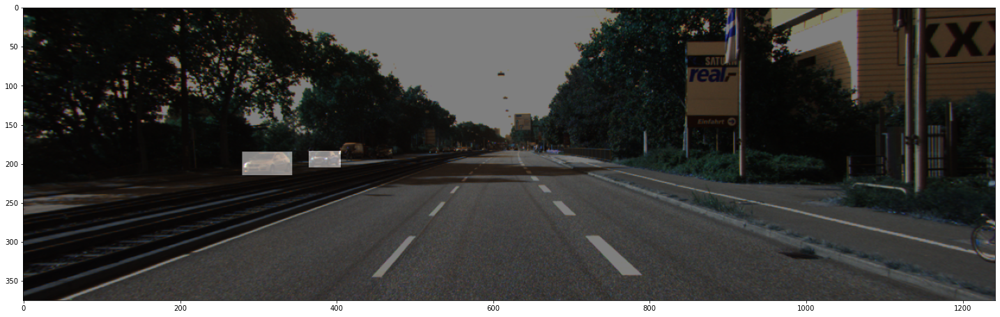

In [7]:
DTYPE = np.float64

def get_image(path):
    return cv2.imread(path)

def create_mask(mask_dir, img_shape):
    """
        allows generating a mask, because in the case of the UNET model, at the output we want to have a regular object mask,
        where we fully mark where the objects are.
        
        We have included in them the car, van, truck, and people.
    """
    mask = np.zeros(shape=(img_shape[0], img_shape[1], 1), dtype = DTYPE)
    

    with open(mask_dir) as f:
        content = f.readlines()
    content = [x.split() for x in content] 
    for item in content:
        if item[0]=='Car' or item[0]=='Truck' or item[0]=='Van' or item[0]=='Pedestrian':
            ul_col, ul_row = int(float(item[4])), int(float(item[5]))
            lr_col, lr_row = int(float(item[6])), int(float(item[7]))
            
            mask[ul_row:lr_row, ul_col:lr_col, 0] = 1 
    return mask


def draw_mask(image, mask, ax = None):
    rgb_mask = np.repeat(mask, 3, axis = 2)
    img = cv2.addWeighted( image, 0.5, rgb_mask, 0.5, 0)
    if ax == None:
        plt.imshow(img)
    else:
        ax.imshow(img)
        
def draw_mask_id(id):
    # ponieważ maska to wartości 0,1 a obraz to wartości 0-255, to obraz trzeba podzielić przez 255.0
    img = np.array(get_image(os.path.join(IMAGE_PATH,id + '.png')) / 255.0, dtype = DTYPE) 
    mask = create_mask(os.path.join(LABEL_PATH,  id + '.txt'), img.shape )
    draw_mask(img,mask)
    plt.show()
    
    
draw_mask_id('000004')

**Now we create the KittiDataGenerator class, and it has an image at the input, and at the output an image with the same dimensions.**

In [10]:
from abc import ABCMeta, abstractmethod
import imgaug.augmenters as iaa
from imgaug.augmentables.segmaps import SegmentationMapsOnImage



class DataGenerator(tf.keras.utils.Sequence):
    """
      This abstract class is everything that needs to be programmed for ImageDataGenerator.
        We added a get_data() method, which will fetch the needed batch size for us.
    """
    def __init__(self,indices, batch_size, shuffle):
        self.indices = indices
        self.batch_size = batch_size
        self.shuffle = shuffle


        self.on_epoch_end()
        
    def __len__(self):
        return len(self.indices) // self.batch_size

    def __getitem__(self, index):
        index = self.index[index * self.batch_size:(index + 1) * self.batch_size]
        batch = [self.indices[k] for k in index]
        
        return self.get_data(batch)
    
    def sample(self):
        return self[random.randint(0,len(self))]

    def on_epoch_end(self):
        self.index = np.arange(len(self.indices))
        if self.shuffle == True:
            np.random.shuffle(self.index)

    @abstractmethod
    def get_data(self, batch):
        raise NotImplementedError
        

In [11]:
       
class KittiDataGenerator(DataGenerator):
    """
      Bounding Box for objects.
    """
    def __init__(self, 
                 df,
                 shape = (IMAGE_WIDTH, IMAGE_HEIGHT),
                 
                 batch_size=32, 
                 shuffle=True, 
                 
                 augmentation = None,
                 
                 image_col = 'images',
                 mask_col = 'masks',
                 
                 label_path = LABEL_PATH,
                 image_path = IMAGE_PATH
                ):
        
        self.df = df
        self.shape = shape

        self.image_col = image_col
        self.mask_col = mask_col
        self.label_path = label_path
        self.image_path = image_path
        self.augmentation = augmentation
        
        super().__init__(self.df.index.tolist(), batch_size, shuffle)
    
    def get_x(self, index):
        return get_image(
            os.path.join(self.image_path, self.df.loc[index][self.image_col])
        ) 
    
    def get_y(self, index, shape):
        return create_mask(os.path.join(self.label_path, self.df.loc[index][self.mask_col]),shape) 


    def get_data(self, batch):
        batch_X = []
        batch_y = []
        
        for i in batch:
            image_r = self.get_x(i)
            mask_r = self.get_y(i, image_r.shape)
            
            # w przypadku cv2.resize, odwracamy wielkosc, najpierw jest wysokosc, potem szerokosc
            image_r = cv2.resize(image_r, (self.shape[0], self.shape[1]))
            # mask_r po przekształceniu nie będzie posiadac wartości 0,1 a wartości między 0 a 1
            mask_r = cv2.resize(mask_r,(self.shape[0], self.shape[1]))
            
            if self.augmentation is not None:
                mask_r = np.array(mask_r, dtype=np.int32)
                segmap = SegmentationMapsOnImage(mask_r, shape=image_r.shape)
                image_r, segmap = self.augmentation(image = image_r, segmentation_maps = segmap)
                mask_r = segmap.get_arr().astype(np.float64)
                
                
            batch_X.append(image_r)
            batch_y.append(mask_r)
        
        batch_X = np.array(batch_X)
        batch_y = np.array(batch_y)
        

#         if self.augmentation is not None:
#             print(batch_y.shape)
#             batch_y = np.expand_dims(batch_y, axis=3)
#             print(batch_y.shape)
            
#             batch_X, segmap = 
            
#             batch_y = segmap
#             print(batch_y.shape)
#             batch_y = segmap.draw()

        return batch_X  / 255.0, batch_y
    
# Define our augmentation pipeline.
# seq = iaa.Sequential([
#     iaa.Dropout([0.05, 0.2]),      # drop 5% or 20% of all pixels
#     iaa.Sharpen((0.0, 1.0)),       # sharpen the image
#     iaa.Affine(rotate=(-45, 45)),  # rotate by -45 to 45 degrees (affects segmaps)
#     iaa.ElasticTransformation(alpha=50, sigma=5)  # apply water effect (affects segmaps)
# ], random_order=True)

seq = iaa.Sequential([
    iaa.Dropout([0.00, 0.06]),      # drop 5% or 20% of all pixels
    iaa.Sharpen((0.0, 0.1)),       # sharpen the image
    iaa.Multiply((0.5, 1.5), per_channel=0.5), # brightness
    iaa.Affine(rotate=(-10, 10)),  # rotate by -45 to 45 degrees (affects segmaps)
    iaa.GammaContrast((0.5, 2.0))  
])
    
image_generator = KittiDataGenerator(df, 
                                     shape = (IMAGE_WIDTH, IMAGE_HEIGHT),
                                     augmentation = seq)
batch_X,batch_y = image_generator.sample()
print('Input : ', batch_X.shape, batch_X.dtype,' max: ', batch_X.max(),  
      '\nOutput: ', batch_y.shape, batch_y.dtype, ' max: ', batch_y.max())

Input :  (32, 160, 256, 3) float64  max:  1.0 
Output:  (32, 160, 256) float64  max:  1.0


## showing the data

We need to calculate how well the BoundingBox we predicted agrees with the source. For this we need the IOU algorithm, which calculates what common part two masks have and divides it by the sum of both masks. If the masks agree, then dividing one by the other will give us a result of one. The smaller the common area relative to the union of the two areas, the closer the IOU is to zero.


https://www.pyimagesearch.com/2016/11/07/intersection-over-union-iou-for-object-detection/#:~:text=Intersection%20over%20Union%20is%20an,the%20popular%20PASCAL%20VOC%20challenge.

![IOU](https://www.pyimagesearch.com/wp-content/uploads/2016/09/iou_equation.png)

In [12]:
def calc_IOU(y_true, y_pred, smooth=1):
    y_true_f = keras.layers.Flatten()(y_true)
    y_pred_f = keras.layers.Flatten()(y_pred)
    
    intersection = keras.backend.sum(y_true_f*y_pred_f)
    
    return (2*(intersection + smooth) / (keras.backend.sum(y_true_f) + keras.backend.sum(y_pred_f) + smooth))


def calc_IOU_loss(y_true, y_pred):
    return -calc_IOU(y_true, y_pred)

calc_IOU_loss(batch_y,batch_y) #

<tf.Tensor: shape=(), dtype=float32, numpy=-1.0000033>

## Show data


It also allows us to show, using an example, how well we are handling the data. In this case we don't have a computed y_pred, so the loss should be close to -1.

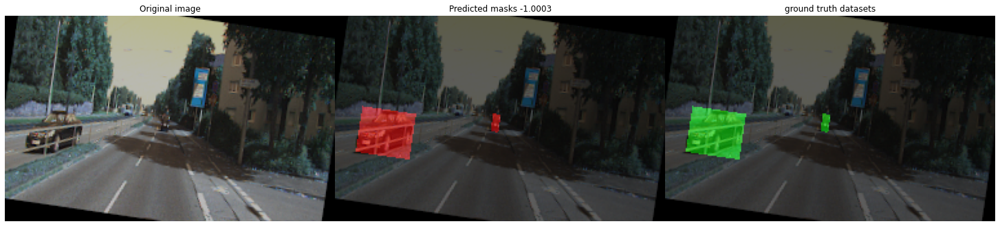

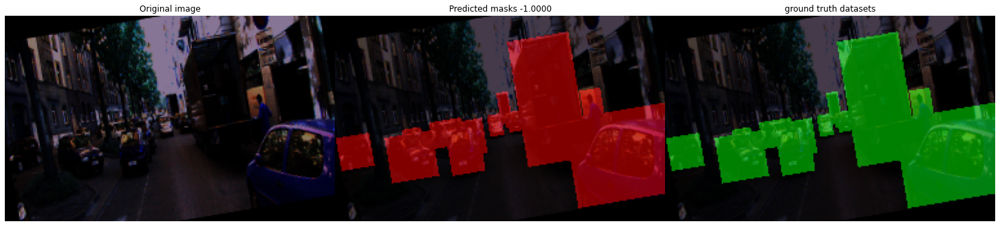

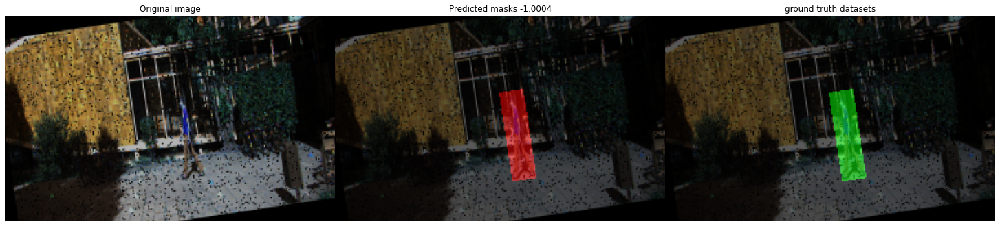

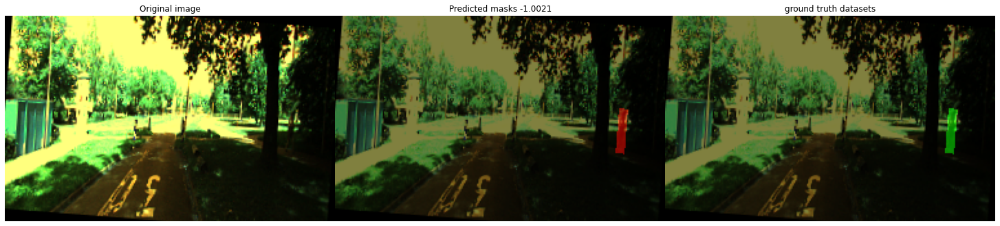

In [13]:
def show_data(X,y, y_pred = None):
    if y_pred is None:
        y_pred = y
        
    for x_i,y_i,y_pred_i in zip(X,y,y_pred):
        im = np.array(255*x_i,dtype=np.uint8)
        im_mask = np.array(255*y_i,dtype=np.uint8)
        im_pred = np.array(255*y_pred_i,dtype=np.uint8)
        im_pred1 = np.array(255*y_pred_i,dtype=np.uint8)

        rgb_mask_pred = cv2.cvtColor(im_pred,cv2.COLOR_GRAY2RGB)
        rgb_mask_pred1 = cv2.cvtColor(im_pred,cv2.COLOR_GRAY2RGB)
        temp1 = rgb_mask_pred[:,:,1:3]
        temp2 = rgb_mask_pred[:,:,1:2]
        rgb_mask_pred[:,:,1:3] = 0*rgb_mask_pred[:,:,1:3]
        rgb_mask_true= cv2.cvtColor(im_mask,cv2.COLOR_GRAY2RGB)
        rgb_mask_true[:,:,0] = 0*rgb_mask_true[:,:,0]
        rgb_mask_true[:,:,2] = 0*rgb_mask_true[:,:,2]
        
#         print(im.shape, rgb_mask_pred.shape)

        img_pred = cv2.addWeighted(rgb_mask_pred,0.5,im,0.5,0)
        img_true = cv2.addWeighted(rgb_mask_true,0.5,im,0.5,0)
        
        loss = calc_IOU_loss(np.array([y_i]),np.array([y_pred_i]))
    
        plt.figure(figsize=(20,8))
        plt.subplot(1,3,1)
        plt.imshow(im)
        plt.title('Original image')
        plt.axis('off')
        plt.subplot(1,3,2)
        plt.imshow(img_pred)
        plt.title(f'Predicted masks {loss:0.4f}')
        plt.axis('off')
        plt.subplot(1,3,3)
        plt.imshow(img_true)
        plt.title('ground truth datasets')
        plt.axis('off')
        plt.tight_layout(pad=0)
        plt.show()

show_data(batch_X[:4], batch_y[:4])

## Train, Test split

Here we are dividing our dataset into train and test

In [14]:
set_seed(SEED)

df_train, df_val = train_test_split(df, test_size=0.25, shuffle=True)
df_train.head()

,masks,images
3025,003025.txt,003025.png
5716,005716.txt,005716.png
5634,005634.txt,005634.png
6105,006105.txt,006105.png
4175,004175.txt,004175.png


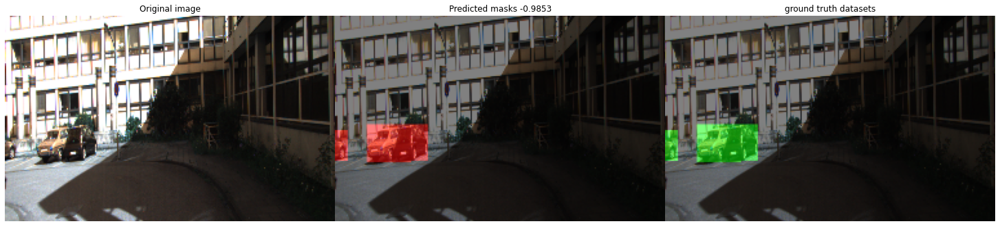

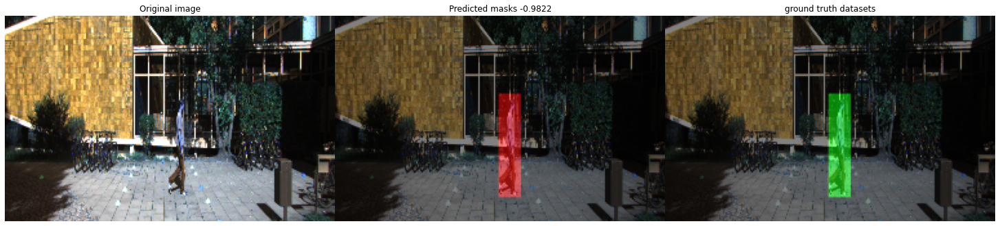

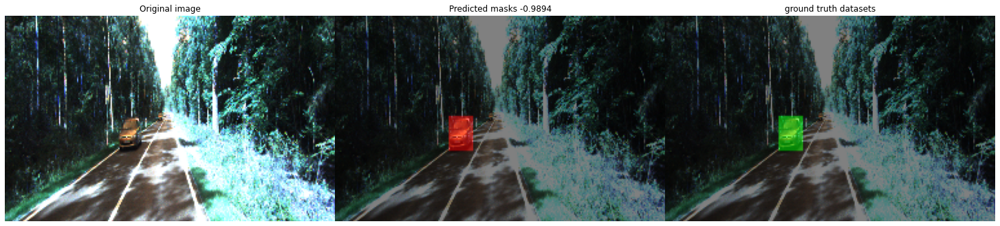

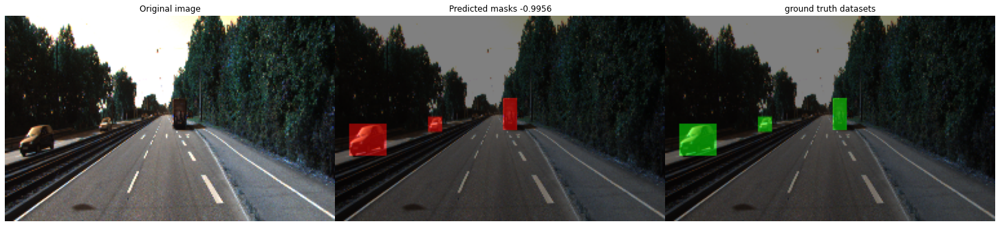

In [44]:
kitti_train = KittiDataGenerator(df_train,
                                 shape = (IMAGE_WIDTH, IMAGE_HEIGHT), augmentation = seq)

kitti_val =  KittiDataGenerator(df_val,
                                 shape = (IMAGE_WIDTH, IMAGE_HEIGHT))

batch_X, batch_y = kitti_val.sample()
show_data(batch_X[:4], batch_y[:4])

# Model

Our model will be a standard UNET model, which means it narrows toward the middle and expands from the middle; `upsample` allows connecting layers with each other

In [16]:
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras.optimizers import Adam


def upsample_conv(filters, kernel_size, strides, padding):
    return layers.Conv2DTranspose(filters, kernel_size, strides=strides, padding=padding)

def upsample_simple(filters, kernel_size, strides, padding):
    return layers.UpSampling2D(strides)


def create_model(image_width = IMAGE_WIDTH,image_height = IMAGE_HEIGHT, 
                 upsample = upsample_simple ):
    # input_img = layers.Input(batch_img.shape[1:], name = 'RGB_Input')
    input_img = layers.Input((image_height, image_width,3), name = 'RGB_Input')
    pp_in_layer = input_img
             
    c1 = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(pp_in_layer) # 
    c1 = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)
    
    c2 = layers.Conv2D(16, (3, 3), activation='relu', padding='same')(p1)
    c2 = layers.Conv2D(16, (3, 3), activation='relu', padding='same')(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)
    
    c3 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(p2)
    c3 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(c3)
    p3 = layers.MaxPooling2D((2, 2)) (c3)
    
    c4 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(p3)
    c4 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c4)
    p4 = layers.MaxPooling2D(pool_size=(2, 2)) (c4)
    
    c5 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(p4)
    c5 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c5)
    
    
    u6 = upsample(64, (2, 2), strides=(2, 2), padding='same')(c5)
    
    u6 = layers.concatenate([u6, c4])
    c6 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(u6)
    c6 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c6)
    
    u7 = upsample(32, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = layers.concatenate([u7, c3])
    c7 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(u7)
    c7 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(c7)
    
    u8 = upsample(16, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = layers.concatenate([u8, c2])
    c8 = layers.Conv2D(16, (3, 3), activation='relu', padding='same')(u8)
    c8 = layers.Conv2D(16, (3, 3), activation='relu', padding='same')(c8)
    
    u9 = upsample(8, (2, 2), strides=(2, 2), padding='same') (c8)
    u9 = layers.concatenate([u9, c1], axis=3)
    c9 = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(u9)
    c9 = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(c9)
    
    d = layers.Conv2D(1, (1, 1), activation='sigmoid')(c9)
    seg_model = models.Model(inputs=[input_img], outputs=[d])

    
    seg_model.compile(optimizer=Adam(lr=1e-4),
              loss=calc_IOU_loss, metrics=[calc_IOU])
    
    seg_model.summary()
    
    return seg_model

model = create_model()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
RGB_Input (InputLayer)          [(None, 160, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 160, 256, 8)  224         RGB_Input[0][0]                  
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 160, 256, 8)  584         conv2d[0][0]                     
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 80, 128, 8)   0           conv2d_1[0][0]                   
_______________________________________________________________________________________

In [ ]:
keras.utils.plot_model(model, show_shapes=True, show_layer_names=True)

## TRAIN IMAGE

## Training the model

In [19]:
!pip install typing_extensions
!pip install livelossplot
from livelossplot import PlotLossesKeras
print(PlotLossesKeras)

You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


ImportError: cannot import name 'Literal' from 'typing' (/opt/conda/lib/python3.7/typing.py)

In [20]:
!pip uninstall livelossplot -y
!pip install livelossplot==0.5.2

Found existing installation: livelossplot 0.5.7
Uninstalling livelossplot-0.5.7:
  Successfully uninstalled livelossplot-0.5.7
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [26]:
from livelossplot import PlotLossesKeras
print(PlotLossesKeras)

<function PlotLossesKeras at 0x7d0f3c357ef0>


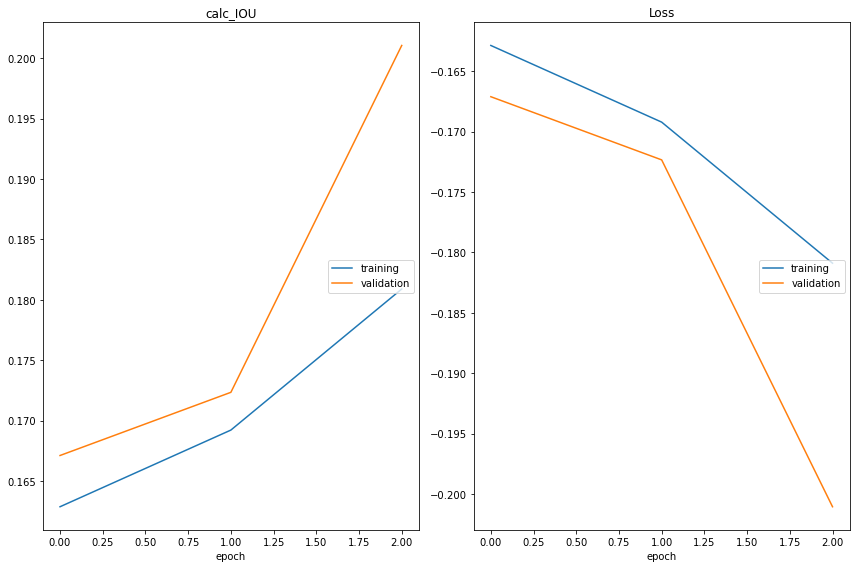

calc_IOU
	training         	 (min:    0.163, max:    0.181, cur:    0.181)
	validation       	 (min:    0.167, max:    0.201, cur:    0.201)
Loss
	training         	 (min:   -0.181, max:   -0.163, cur:   -0.181)
	validation       	 (min:   -0.201, max:   -0.167, cur:   -0.201)
20/20 [==============================] - 52s 3s/step - loss: -0.1809 - calc_IOU: 0.1809 - val_loss: -0.2011 - val_calc_IOU: 0.2011
Epoch 4/200
10/20 [==============>...............] - ETA: 9s - loss: -0.1794 - calc_IOU: 0.1794 

KeyboardInterrupt: 

In [45]:
loss_history =  model.fit(
        kitti_train,
        steps_per_epoch=20,
        epochs=200,
        validation_data=kitti_val,
        callbacks=[ PlotLossesKeras()]
    )

In [43]:
print(f"Validation samples: {len(kitti_train)}")
print(f"Batch size: {BATCH_SIZE}")

Validation samples: 0
Batch size: 10


We save our model, for later. Maybe we will continue training it.

In [ ]:
model.save('/kaggle/working/model_v1')

Our validation sample is the same one we used for the model

In [ ]:
X_batch, y_batch = kitti_val.sample()

print(X_batch.shape)

In [ ]:
y_batch_pred = model.predict(X_batch)
print(X_batch.shape, y_batch.shape, y_batch_pred[:,:,:,0].shape)

print(calc_IOU_loss(y_batch,y_batch_pred))

We look at the results of our model

In [ ]:
show_data(X_batch, y_batch, y_batch_pred[:,:,:,0])